In [1]:
import pandas as pd
red_wine_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv"
white_wine_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv"

red_wine = pd.read_csv(red_wine_url, sep=';')
white_wine = pd.read_csv(white_wine_url, sep=';')

red_wine['wineType'] = 'red'
white_wine['wineType'] = 'white'
wine_data = pd.concat([red_wine, white_wine], ignore_index=True)
print(wine_data.head())
wine_data.to_csv("wine_quality_combined.csv", index=False)


   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality wineType  
0      9.4        5      red  
1      9.8        5     

In [2]:
print("Red wine rows:", len(red_wine))
print("White wine rows:", len(white_wine))
print("Combined rows:", len(wine_data))


Red wine rows: 1599
White wine rows: 4898
Combined rows: 6497


In [3]:
print(wine_data.info())
print(wine_data.describe())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  wineType              6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB
None
       fixed acidity  volatile acidity  citric acid  resid

In [4]:
print(wine_data['wineType'].value_counts())


wineType
white    4898
red      1599
Name: count, dtype: int64


## Summary Statistics:

In [6]:
numeric_columns = wine_data.select_dtypes(include=['float64', 'int64'])
summary_stats = numeric_columns.describe().transpose()
summary_stats['range'] = summary_stats['max'] - summary_stats['min']
summary_stats['variance'] = numeric_columns.var()
print(summary_stats)



                       count        mean        std      min       25%  \
fixed acidity         6497.0    7.215307   1.296434  3.80000   6.40000   
volatile acidity      6497.0    0.339666   0.164636  0.08000   0.23000   
citric acid           6497.0    0.318633   0.145318  0.00000   0.25000   
residual sugar        6497.0    5.443235   4.757804  0.60000   1.80000   
chlorides             6497.0    0.056034   0.035034  0.00900   0.03800   
free sulfur dioxide   6497.0   30.525319  17.749400  1.00000  17.00000   
total sulfur dioxide  6497.0  115.744574  56.521855  6.00000  77.00000   
density               6497.0    0.994697   0.002999  0.98711   0.99234   
pH                    6497.0    3.218501   0.160787  2.72000   3.11000   
sulphates             6497.0    0.531268   0.148806  0.22000   0.43000   
alcohol               6497.0   10.491801   1.192712  8.00000   9.50000   
quality               6497.0    5.818378   0.873255  3.00000   5.00000   

                            50%      

## Data Visualization

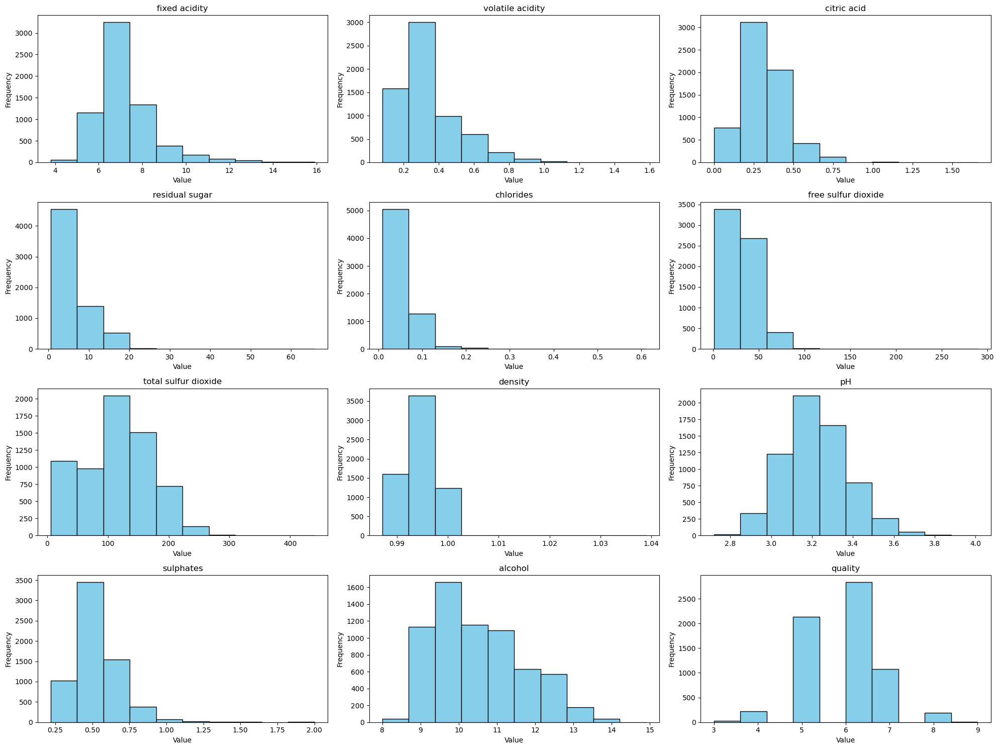

In [8]:
import matplotlib.pyplot as plt
numeric_columns = wine_data.select_dtypes(include=['float64', 'int64']).columns
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(4, 3, i)  
    plt.hist(wine_data[column], bins=10, color='skyblue', edgecolor='black')
    plt.title(column, fontsize=12)
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


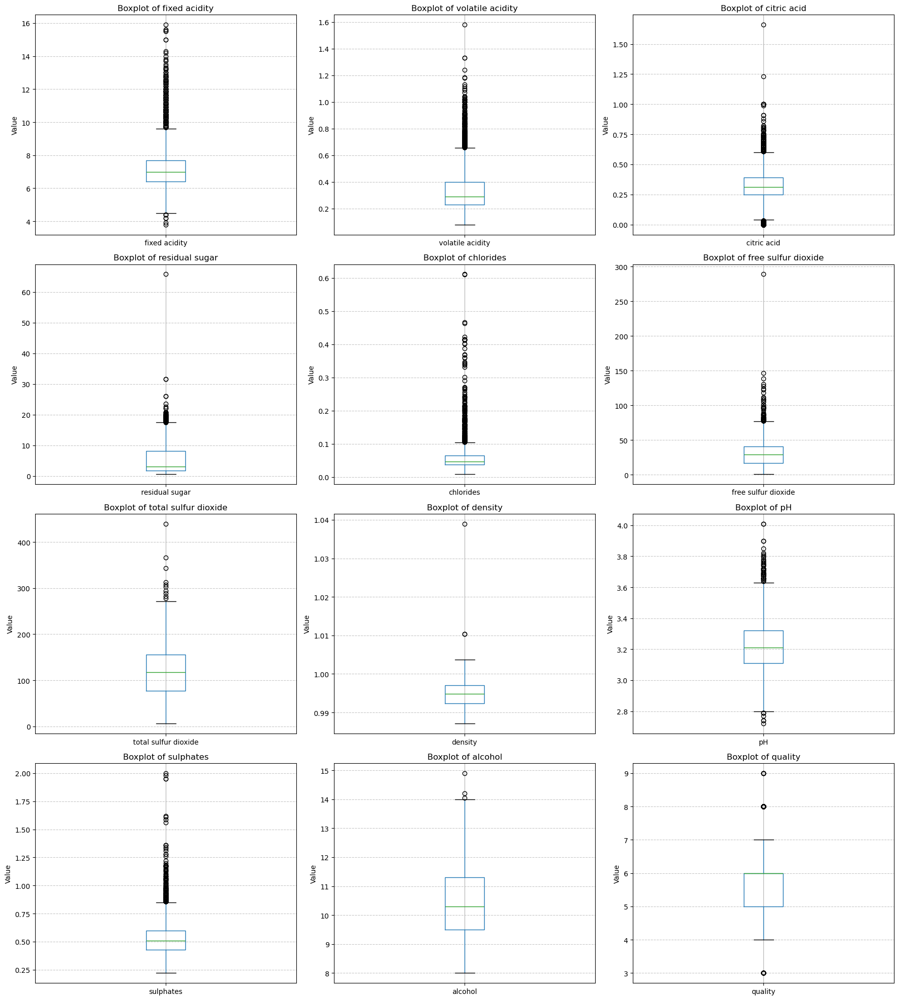

In [9]:
import matplotlib.pyplot as plt
numeric_columns = [col for col in wine_data.columns if pd.api.types.is_numeric_dtype(wine_data[col])]
num_features = len(numeric_columns)
rows = (num_features // 3) + (num_features % 3 > 0)  # 3 plots per row
fig, axes = plt.subplots(rows, 3, figsize=(18, 5 * rows))
axes = axes.flatten()  


for i, column in enumerate(numeric_columns):
    wine_data.boxplot(column=column, ax=axes[i])
    axes[i].set_title(f"Boxplot of {column}", fontsize=12)
    axes[i].set_ylabel("Value", fontsize=10)
    axes[i].grid(axis="y", linestyle="--", alpha=0.7)


for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()



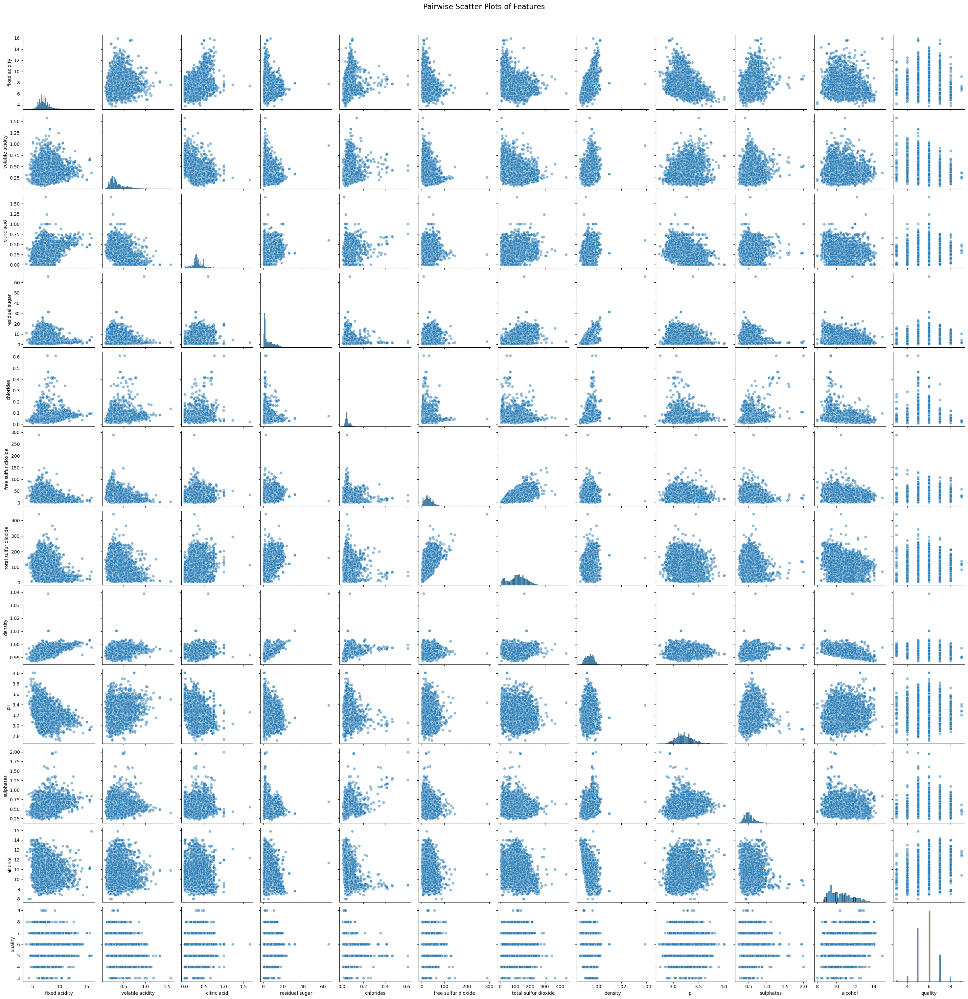

In [10]:
import seaborn as sns

sns.pairplot(wine_data[numeric_columns], diag_kind="hist", plot_kws={"alpha": 0.5})
plt.suptitle("Pairwise Scatter Plots of Features", y=1.02, fontsize=16)
plt.show()


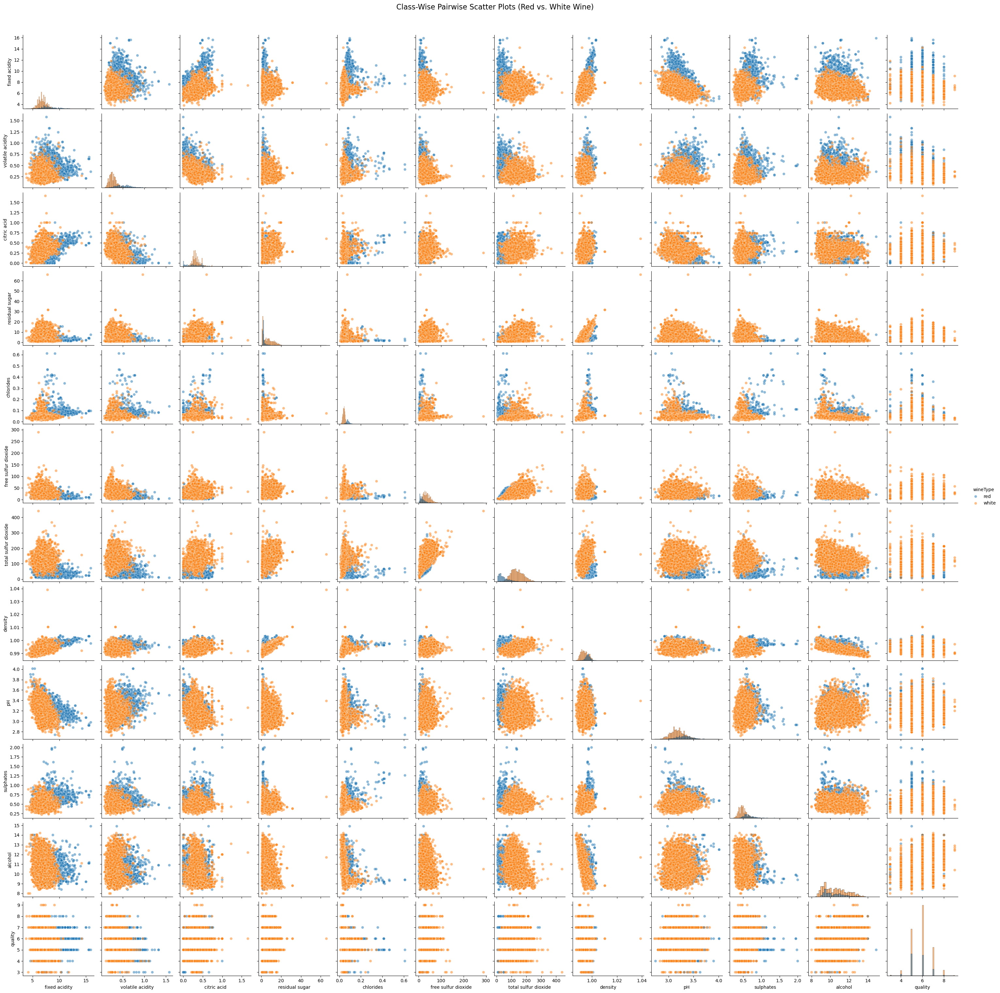

In [11]:
sns.pairplot(wine_data, hue="wineType", diag_kind="hist", plot_kws={"alpha": 0.5})
plt.suptitle("Class-Wise Pairwise Scatter Plots (Red vs. White Wine)", y=1.02, fontsize=16)
plt.show()


## Conceptual Questions [25 Points]

### 1. How many features are there? What are the types of the features (e.g., numeric,
### nominal, discrete, continuous)?
 Number of Features: The dataset contains 13 features.
Types of Features:
Numeric:
Continuous: fixed acidity, volatile acidity, citric acid, residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, density, pH, sulphates, alcohol.
Discrete: quality (integer values from 3 to 9).
Categorical:
Nominal: wineType (values: red, white).
                      



### 2. What can you conclude from the histograms about the distribution of the features in
### the dataset? Are there any features that are approximately normally distributed? Are
### there any features that are highly skewed?
Observations from Histograms
Most features exhibit skewed distributions:
Highly Skewed: residual sugar, free sulfur dioxide, total sulfur dioxide, and chlorides are positively skewed (long tail on the right).
Approximately Normally Distributed: fixed acidity, citric acid, density, and alcohol appear closer to a normal distribution.
Some features, such as pH and quality, show a narrower range and fewer distinct values.

### 3. Based on the box plots, are there any features that appear to have many outliers? Are
### there any features that appear to have a similar spread of values across different quality
### ratings? Are there any features that appear to have different spreads of values across
### different quality ratings?
Observations from Box Plots
Outliers:
Features such as residual sugar, chlorides, free sulfur dioxide, and total sulfur dioxide have many outliers, indicating extreme values that differ significantly from the central distribution.
Similar Spread Across Quality Ratings:
Features like density and pH have relatively consistent spreads across different quality levels.
Different Spreads Across Quality Ratings:
Features such as alcohol and volatile acidity exhibit noticeably different spreads for higher vs. lower quality wines.

### 4. Based on the pairwise plots, which features appear to be highly correlated? Are there
### any features that do not appear to be correlated with any other features?
Observations from Pairwise Plots
Highly Correlated Features:
total sulfur dioxide and free sulfur dioxide show a strong positive correlation.
density is inversely correlated with alcohol.
Weakly or Uncorrelated Features:
pH and citric acid do not show significant correlations with other features.


### 5. Based on the class-wise visualizations, are there any pairs of features that appear to be
### more correlated for certain wine types than for others?
Observations from Class-Wise Visualizations
Class-Specific Correlations:
For white wines, residual sugar and density show a strong positive correlation, but this relationship is weaker for red wines.
alcohol and volatile acidity have different patterns for red and white wines, with red wines exhibiting a stronger inverse relationship.
These differences highlight how physicochemical properties influence red and white wines differently.

# Forest Fires Dataset

In [18]:
import pandas as pd
url = "http://archive.ics.uci.edu/ml/machine-learning-databases/forest-fires/forestfires.csv"
forest_fires = pd.read_csv(url)
print(forest_fires.head())


   X  Y month  day  FFMC   DMC     DC  ISI  temp  RH  wind  rain  area
0  7  5   mar  fri  86.2  26.2   94.3  5.1   8.2  51   6.7   0.0   0.0
1  7  4   oct  tue  90.6  35.4  669.1  6.7  18.0  33   0.9   0.0   0.0
2  7  4   oct  sat  90.6  43.7  686.9  6.7  14.6  33   1.3   0.0   0.0
3  8  6   mar  fri  91.7  33.3   77.5  9.0   8.3  97   4.0   0.2   0.0
4  8  6   mar  sun  89.3  51.3  102.2  9.6  11.4  99   1.8   0.0   0.0


In [19]:
numeric_columns = forest_fires.select_dtypes(include=['float64', 'int64'])
summary_stats = numeric_columns.describe().transpose()
summary_stats['range'] = summary_stats['max'] - summary_stats['min']
summary_stats['variance'] = numeric_columns.var()
print(summary_stats)



      count        mean         std   min    25%     50%     75%      max  \
X     517.0    4.669246    2.313778   1.0    3.0    4.00    7.00     9.00   
Y     517.0    4.299807    1.229900   2.0    4.0    4.00    5.00     9.00   
FFMC  517.0   90.644681    5.520111  18.7   90.2   91.60   92.90    96.20   
DMC   517.0  110.872340   64.046482   1.1   68.6  108.30  142.40   291.30   
DC    517.0  547.940039  248.066192   7.9  437.7  664.20  713.90   860.60   
ISI   517.0    9.021663    4.559477   0.0    6.5    8.40   10.80    56.10   
temp  517.0   18.889168    5.806625   2.2   15.5   19.30   22.80    33.30   
RH    517.0   44.288201   16.317469  15.0   33.0   42.00   53.00   100.00   
wind  517.0    4.017602    1.791653   0.4    2.7    4.00    4.90     9.40   
rain  517.0    0.021663    0.295959   0.0    0.0    0.00    0.00     6.40   
area  517.0   12.847292   63.655818   0.0    0.0    0.52    6.57  1090.84   

        range      variance  
X        8.00      5.353568  
Y        7.00  

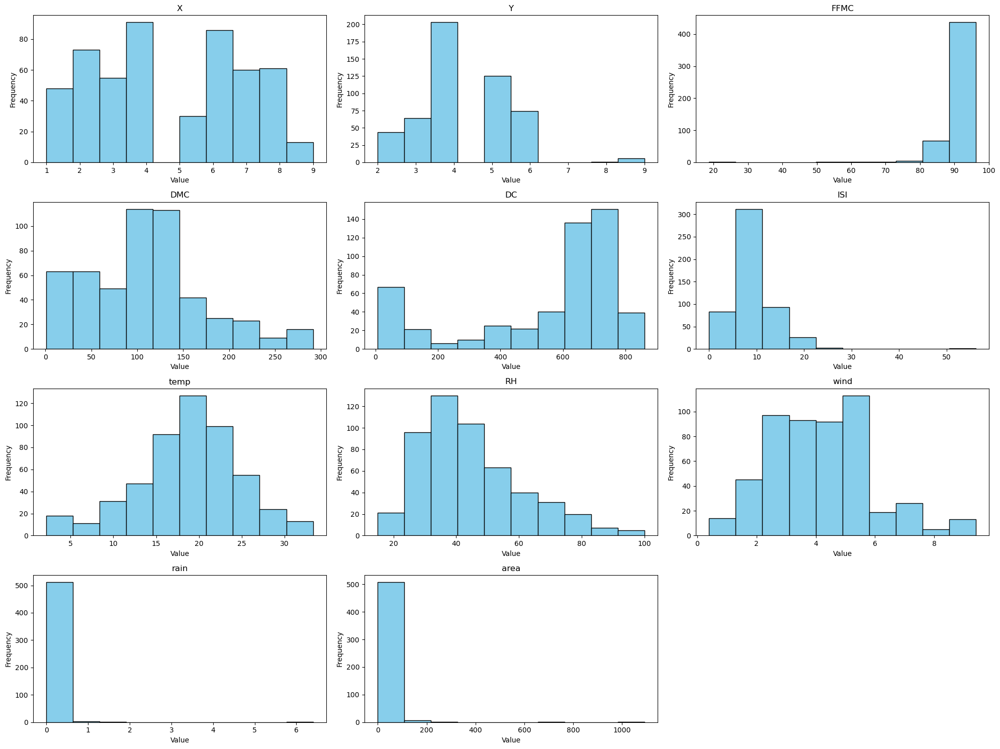

In [20]:
import matplotlib.pyplot as plt
numeric_columns = forest_fires.select_dtypes(include=['float64', 'int64']).columns
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(4, 3, i) 
    plt.hist(forest_fires[column], bins=10, color='skyblue', edgecolor='black')
    plt.title(column, fontsize=12)
    plt.xlabel('Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()



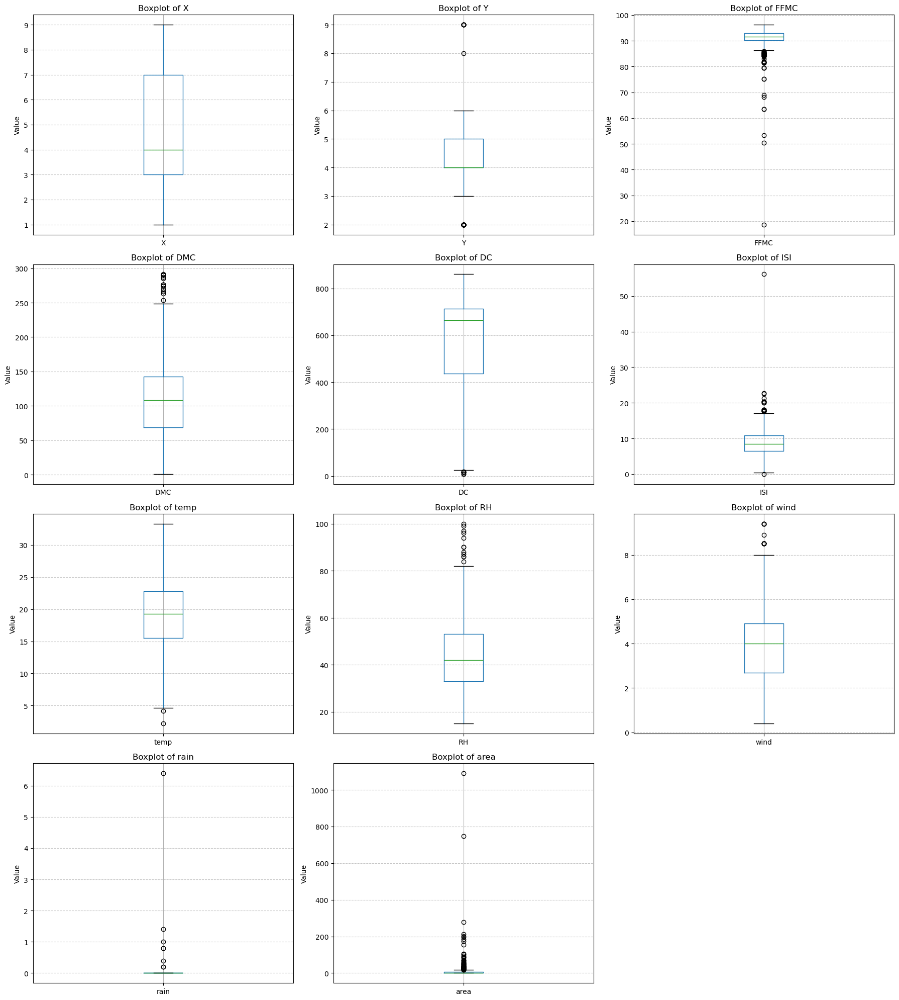

In [21]:
import matplotlib.pyplot as plt
numeric_columns = [col for col in forest_fires.columns if pd.api.types.is_numeric_dtype(forest_fires[col])]
num_features = len(numeric_columns)
rows = (num_features // 3) + (num_features % 3 > 0)  
fig, axes = plt.subplots(rows, 3, figsize=(18, 5 * rows))
axes = axes.flatten()
for i, column in enumerate(numeric_columns):
    forest_fires.boxplot(column=column, ax=axes[i])
    axes[i].set_title(f"Boxplot of {column}", fontsize=12)
    axes[i].set_ylabel("Value", fontsize=10)
    axes[i].grid(axis="y", linestyle="--", alpha=0.7)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


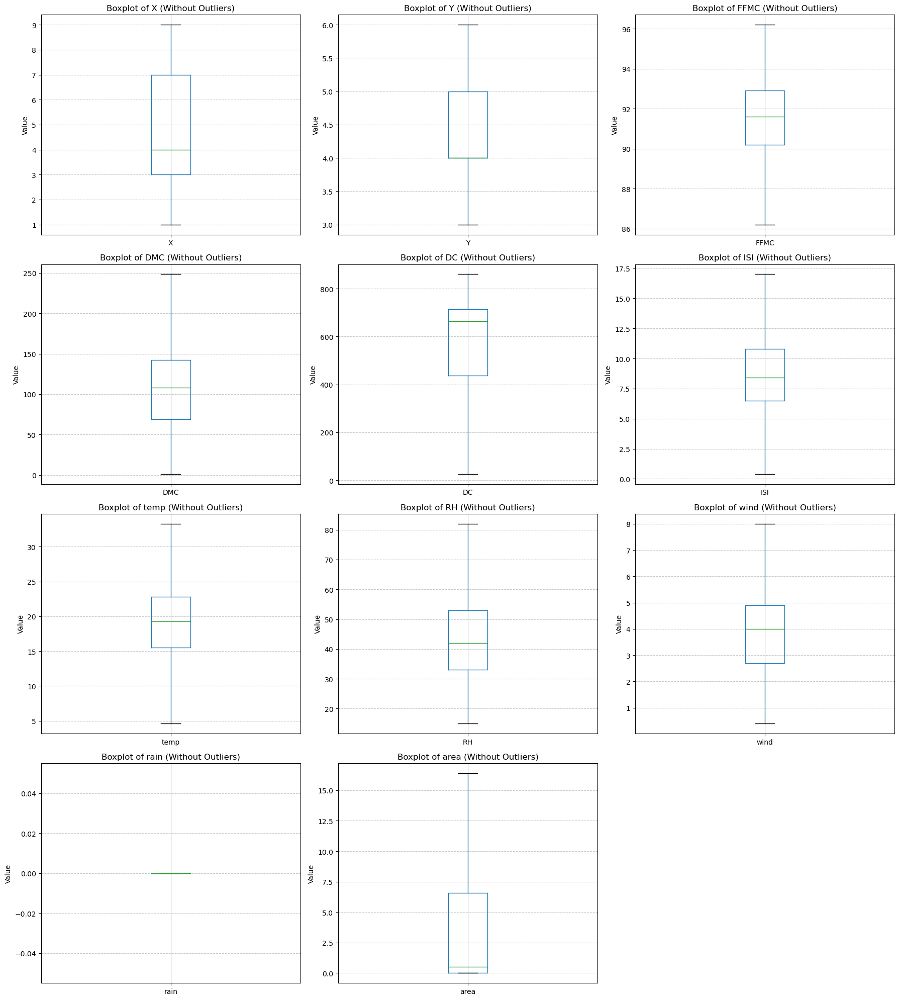

In [22]:
import matplotlib.pyplot as plt


numeric_columns = [col for col in forest_fires.columns if pd.api.types.is_numeric_dtype(forest_fires[col])]


num_features = len(numeric_columns)
rows = (num_features // 3) + (num_features % 3 > 0) 
fig, axes = plt.subplots(rows, 3, figsize=(18, 5 * rows))
axes = axes.flatten()  


for i, column in enumerate(numeric_columns):
    forest_fires.boxplot(column=column, ax=axes[i], showfliers=False) 
    axes[i].set_title(f"Boxplot of {column} (Without Outliers)", fontsize=12)
    axes[i].set_ylabel("Value", fontsize=10)
    axes[i].grid(axis="y", linestyle="--", alpha=0.7)


for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


## Conceptual Questions

### 1. From the boxplot without outliers, which features have a significantly different distribution from others? Why?
Features such as rain, area, FFMC, and DMC have distributions that are significantly different from others:
rain: Most values are concentrated at 0, with very few non-zero values. This creates a highly skewed distribution.
area: The burned area is heavily skewed, with most values near 0 and only a few fires covering large areas.
FFMC and DMC: These indices are tightly concentrated around specific ranges, showing narrower distributions compared to features like temp or RH.
The difference in distributions arises due to the nature of the features:
Meteorological indices like FFMC and DMC are bounded and calculated based on conditions, leading to narrower spreads.
Features like rain and area often have zero-inflated distributions, reflecting the rarity of significant rain or large burned areas.

### What do the outliers in the features mean? If you remove the outliers from the dataset, what problems might arise?
Meaning of Outliers:
Outliers represent extreme values that deviate significantly from the majority of the data.
For example:
area outliers: Represent unusually large fires.
rain outliers: Indicate rare instances of heavy rainfall.
FFMC outliers: Reflect exceptional meteorological conditions that increase fire risk.
Problems from Removing Outliers:
Removing outliers may lead to:
Loss of Important Information: Extreme values often capture critical events (e.g., large fires or extreme weather) that may hold valuable insights.
Bias in Analysis: Excluding outliers can distort the true distribution and relationships in the dataset.
Reduced Generalizability: Models trained on data without outliers might perform poorly when encountering extreme cases in real-world scenarios.

## 3. Create a histogram for only FFMC after removing all values outside the range [88, 96].

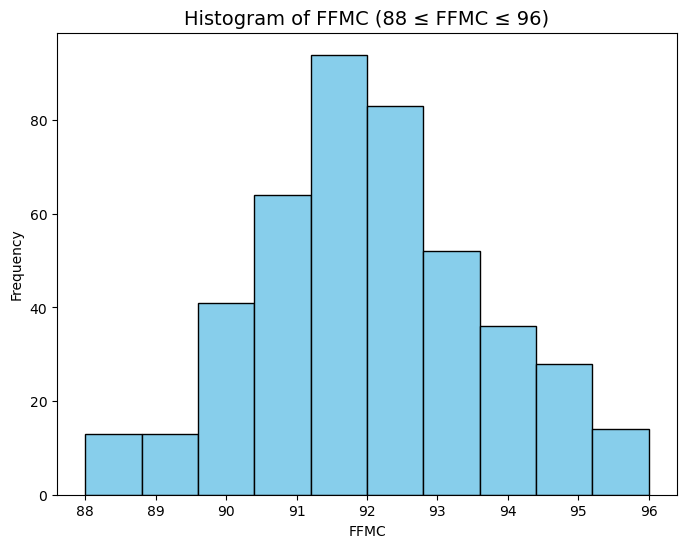

In [27]:

filtered_ffmc = forest_fires[(forest_fires['FFMC'] >= 88) & (forest_fires['FFMC'] <= 96)]['FFMC']


plt.figure(figsize=(8, 6))
plt.hist(filtered_ffmc, bins=10, color='skyblue', edgecolor='black')
plt.title("Histogram of FFMC (88 ≤ FFMC ≤ 96)", fontsize=14)
plt.xlabel("FFMC")
plt.ylabel("Frequency")
plt.show()

## 4. What distribution does the new histogram follow?
The new histogram of FFMC (after filtering values in the range [88, 96]) follows a normal-like distribution:
The values are tightly concentrated within the specified range, with a peak around the mean.
This is expected, as the FFMC index is a fire weather index designed to be bounded and normally distributed under typical conditions.